<a href="https://www.kaggle.com/code/klyushnik/episode-13?scriptVersionId=168444289" target="_blank"><img align="left" alt="Kaggle" title="Open in Kaggle" src="https://kaggle.com/static/images/open-in-kaggle.svg"></a>

In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import pandas_profiling
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib as mpl
mpl.rcParams.update(mpl.rcParamsDefault)
import warnings
warnings.filterwarnings('ignore')
from IPython.display import Image
%matplotlib inline

from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2

from sklearn.model_selection import train_test_split

import os
import catboost
from catboost import *
from catboost import CatBoostClassifier

from catboost.utils import get_roc_curve
from sklearn import metrics

from sklearn.model_selection import KFold, StratifiedKFold,  RepeatedStratifiedKFold
from sklearn.metrics import log_loss

import optuna

import sklearn.model_selection
import sklearn.svm
import itertools
from sklearn.metrics import classification_report
import pickle
from sklearn.metrics import accuracy_score
import lightgbm as lgb
import xgboost as xgb
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import RepeatedStratifiedKFold
from mlxtend.classifier import StackingCVClassifier 
from sklearn.datasets import make_classification
from sklearn.model_selection import cross_val_score
from matplotlib import pyplot
from sklearn.svm import SVC

from sklearn.neural_network import MLPClassifier
from sklearn.ensemble import RandomForestClassifier, VotingClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.gaussian_process import GaussianProcessClassifier
from sklearn.gaussian_process.kernels import RBF
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.decomposition import PCA

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/vector-borne-disease-prediction/testt.csv
/kaggle/input/vector-borne-disease-prediction/trainn.csv
/kaggle/input/playground-series-s3e13/sample_submission.csv
/kaggle/input/playground-series-s3e13/train.csv
/kaggle/input/playground-series-s3e13/test.csv


# Load data

In [2]:
train = pd.read_csv('/kaggle/input/playground-series-s3e13/train.csv')
test = pd.read_csv('/kaggle/input/playground-series-s3e13/test.csv')
original = pd.read_csv('/kaggle/input/vector-borne-disease-prediction/trainn.csv')
train = train.drop(columns=['id'])
test = test.drop(columns=['id'])
train = pd.concat([train, original], axis=0).reset_index(drop=True)

In [3]:
print('Missing values:',train.isnull().sum())

Missing values: sudden_fever      0
headache          0
mouth_bleed       0
nose_bleed        0
muscle_pain       0
                 ..
ulcers            0
toenail_loss      0
speech_problem    0
bullseye_rash     0
prognosis         0
Length: 65, dtype: int64


In [4]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 959 entries, 0 to 958
Data columns (total 65 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   sudden_fever           959 non-null    float64
 1   headache               959 non-null    float64
 2   mouth_bleed            959 non-null    float64
 3   nose_bleed             959 non-null    float64
 4   muscle_pain            959 non-null    float64
 5   joint_pain             959 non-null    float64
 6   vomiting               959 non-null    float64
 7   rash                   959 non-null    float64
 8   diarrhea               959 non-null    float64
 9   hypotension            959 non-null    float64
 10  pleural_effusion       959 non-null    float64
 11  ascites                959 non-null    float64
 12  gastro_bleeding        959 non-null    float64
 13  swelling               959 non-null    float64
 14  nausea                 959 non-null    float64
 15  chills

In [5]:
train.describe()

,sudden_fever,headache,mouth_bleed,nose_bleed,muscle_pain,joint_pain,vomiting,rash,diarrhea,hypotension,...,lymph_swells,breathing_restriction,toe_inflammation,finger_inflammation,lips_irritation,itchiness,ulcers,toenail_loss,speech_problem,bullseye_rash
count,959.000000,959.000000,959.000000,959.000000,959.000000,959.000000,959.000000,959.000000,959.000000,959.000000,...,959.000000,959.000000,959.000000,959.000000,959.000000,959.000000,959.000000,959.000000,959.000000,959.000000
mean,0.506778,0.452555,0.475495,0.503650,0.518248,0.464025,0.451512,0.490094,0.406674,0.412930,...,0.174140,0.098019,0.124088,0.105318,0.110532,0.166840,0.147028,0.145985,0.055266,0.055266
std,0.500215,0.498004,0.499660,0.500248,0.499928,0.498964,0.497903,0.500163,0.491469,0.492617,...,0.379427,0.297495,0.329853,0.307123,0.313715,0.373028,0.354319,0.353276,0.228618,0.228618
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,1.000000,0.000000,0.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [6]:
train.prognosis.unique()

array(['Lyme_disease', 'Tungiasis', 'Zika', 'Rift_Valley_fever',
       'West_Nile_fever', 'Malaria', 'Chikungunya', 'Plague', 'Dengue',
       'Yellow_Fever', 'Japanese_encephalitis', 'Rift Valley fever',
       'Yellow Fever', 'Japanese encephalitis', 'West Nile fever',
       'Lyme disease'], dtype=object)

# Plot information

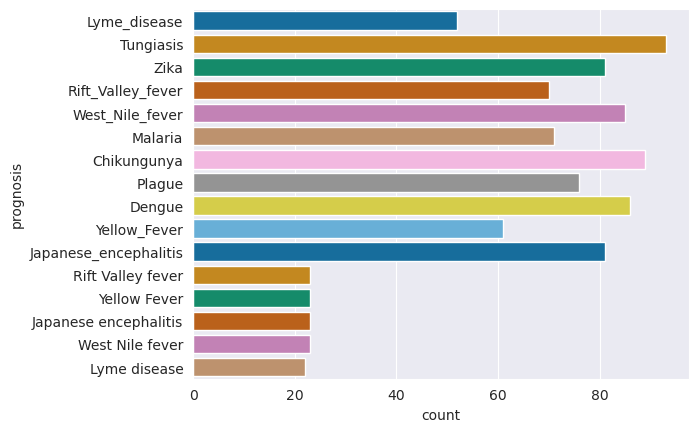

In [7]:
sns.set_style('darkgrid')
sns.countplot(y='prognosis',data=train,palette='colorblind')
plt.xlabel('count')
plt.ylabel('prognosis')
plt.show()

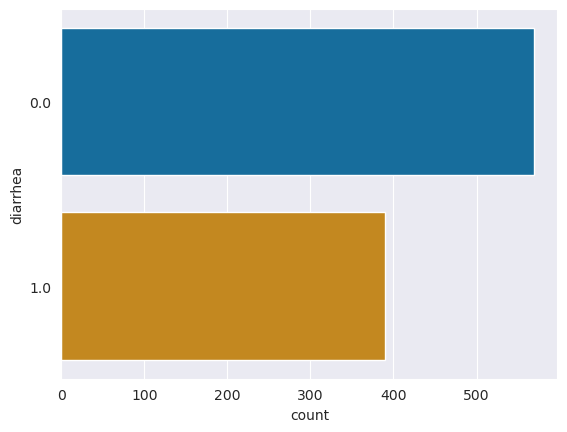

In [8]:
sns.set_style('darkgrid')
sns.countplot(y='diarrhea',data=train,palette='colorblind')
plt.xlabel('count')
plt.ylabel('diarrhea')
plt.show()

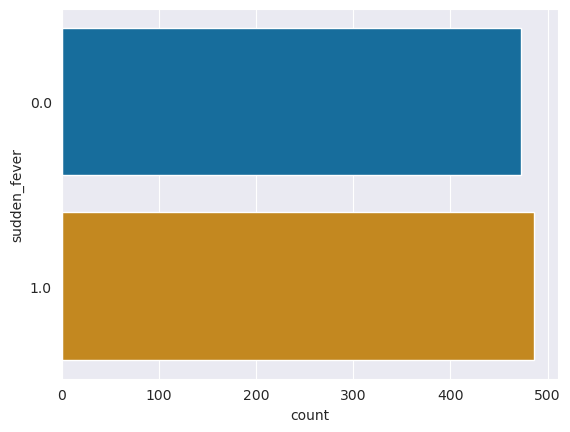

In [9]:
sns.set_style('darkgrid')
sns.countplot(y='sudden_fever',data=train,palette='colorblind')
plt.xlabel('count')
plt.ylabel('sudden_fever')
plt.show()


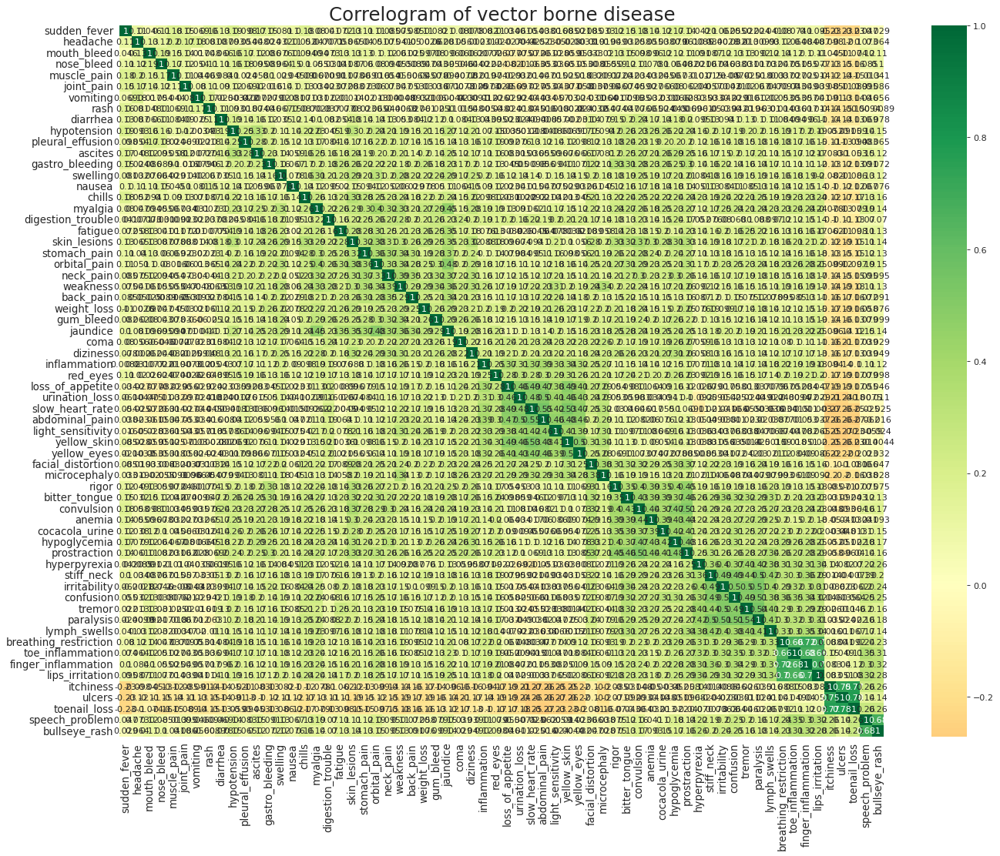

In [10]:
plt.figure(figsize=(20,15), dpi= 80)
sns.heatmap(train.corr(), xticklabels=train.corr().columns, yticklabels=train.corr().columns, cmap='RdYlGn', center=0, annot=True)

# Decorations
plt.title('Correlogram of vector borne disease', fontsize=22)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.show()

# ProfileReport

In [11]:
from pandas_profiling import ProfileReport
ProfileReport(train)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

# Feature selection

In [12]:
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2

X = train.drop(columns=['prognosis'])
y = train.prognosis

bestfeatures = SelectKBest(score_func = chi2, k = 'all')
fit = bestfeatures.fit(X, y)
dfscores = pd.DataFrame(fit.scores_)
dfcolumns = pd.DataFrame(X.columns)

featureScores = pd.concat([dfcolumns, dfscores], axis = 1)
featureScores.columns = ['Specs', 'Score']  
print(featureScores.nlargest(20, 'Score'))  

                    Specs       Score
63          bullseye_rash  416.396133
62         speech_problem  401.034107
61           toenail_loss  334.280073
59              itchiness  295.226233
60                 ulcers  293.819213
56       toe_inflammation  181.193175
54           lymph_swells  180.000860
57    finger_inflammation  175.358933
58        lips_irritation  171.720517
55  breathing_restriction  165.147794
53              paralysis  161.184743
49             stiff_neck  155.195107
43             convulsion  154.017728
51              confusion  153.260150
50           irritability  151.678334
47           prostraction  149.172851
42          bitter_tongue  147.645425
52                 tremor  144.382508
34        slow_heart_rate  138.778015
37            yellow_skin  131.323703


# Data marking

In [13]:
from sklearn.preprocessing import OrdinalEncoder
enc = OrdinalEncoder()
train['prognosis'] = enc.fit_transform(train[['prognosis']])
X = train.drop(columns = ['prognosis'],  axis =1)
y = train.prognosis
X_total = test

# Aggregate Featrues

In [14]:
class AggFeatureExtractor(BaseEstimator, TransformerMixin):
    
    def __init__(self, group_col, agg_col, agg_func):
        self.group_col = group_col
        self.group_col_name = ''
        for col in group_col:
            self.group_col_name += col
        self.agg_col = agg_col
        self.agg_func = agg_func
        self.agg_df = None
        self.medians = None
        
    def fit(self, X, y=None):
        group_col = self.group_col
        agg_col = self.agg_col
        agg_func = self.agg_func
        
        self.agg_df = X.groupby(group_col)[agg_col].agg(agg_func)
        self.agg_df.columns = [f'{self.group_col_name}_{agg}_{_agg_col}' for _agg_col in agg_col for agg in agg_func]
        self.medians = X[agg_col].median()
        
        return self
    
    def transform(self, X):
        group_col = self.group_col
        agg_col = self.agg_col
        agg_func = self.agg_func
        agg_df = self.agg_df
        medians = self.medians
        
        X_merged = pd.merge(X, agg_df, left_on=group_col, right_index=True, how='left')
        X_merged.fillna(medians, inplace=True)
        X_agg = X_merged.loc[:, [f'{self.group_col_name}_{agg}_{_agg_col}' for _agg_col in agg_col for agg in agg_func]]
        
        return X_agg
    
    def fit_transform(self, X, y=None):
        self.fit(X, y)
        X_agg = self.transform(X)
        return X_agg

In [15]:
class Preprocessor:
    def __init__(self, agg_col, agg_func, group_cols):
        self.agg_col = agg_col
        self.agg_func = agg_func
        self.group_cols = group_cols
        
    def preprocess(self, X, X_total):        
        agg_train, agg_test = [], []
        for group_col in self.group_cols:
            agg_extractor = AggFeatureExtractor(group_col=group_col, agg_col=self.agg_col, agg_func=self.agg_func)
            agg_extractor.fit(pd.concat([X, X_total], axis=0))
            agg_train.append(agg_extractor.transform(X))
            agg_test.append(agg_extractor.transform(X_total))
        X = pd.concat([X] + agg_train, axis=1)
        X_total = pd.concat([X_total] + agg_test, axis=1)
        
        pca = PCA(n_components=3)
        principalComponents_train = pca.fit_transform(X)
        principalDf_train = pd.DataFrame(data = principalComponents_train, 
                                         columns = ['principal component 1',
                                                    'principal component 2',
                                                    'principal component 3'])
        principalComponents_test = pca.fit_transform(X_total)
        principalDf_test = pd.DataFrame(data = principalComponents_test, 
                                        columns = ['principal component 1',
                                                   'principal component 2',
                                                   'principal component 3'])
        X = pd.concat([X, principalDf_train], axis=1)
        X_total = pd.concat([X_total, principalDf_test], axis=1)
        
        X = X.fillna(0)
        X_total = X_total.fillna(0)
       
        
        return X, X_total   

In [16]:
agg_col = ['bullseye_rash', 'speech_problem', 'toenail_loss', 'itchiness', 'ulcers', 'toe_inflammation', 
           'lymph_swells', 'finger_inflammation', 'lips_irritation', 'breathing_restriction', 'paralysis',
          'stiff_neck', 'convulsion', 'confusion', 'irritability', 'prostraction', 'bitter_tongue', 'tremor', 
           'slow_heart_rate', 'yellow_skin']

agg_func = ['mean', 'std', 'median']
group_cols = [['bullseye_rash'], ['speech_problem'], ['toenail_loss'], 
              ['bullseye_rash', 'speech_problem'], ['bullseye_rash', 'toenail_loss'], 
              ['speech_problem', 'toenail_loss'], 
              ['bullseye_rash', 'speech_problem', 'toenail_loss']]

pp = Preprocessor(agg_col, agg_func, group_cols)
X, X_total = pp.preprocess(X, X_total)

print(f"X_train shape :{X.shape} , y_train shape :{y.shape}")
print(f"X_test shape :{X_total.shape}")

X_train shape :(959, 487) , y_train shape :(959,)
X_test shape :(303, 487)


# Train test split

In [17]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.45, random_state=42)

# Сlassification Report

In [18]:
def plot_classification_report(classificationReport,
                               title='Classification report',
                               cmap='RdBu'):

    classificationReport = classificationReport.replace('\n\n', '\n')
    classificationReport = classificationReport.replace(' / ', '/')
    lines = classificationReport.split('\n')
    
    classes, plotMat, support, class_names = [], [], [], []
    for line in lines[1 : (len(lines) - 4)]:  # if you don't want avg/total result, then change [1:] into [1:-1]
        t = line.strip().replace(' avg', '-avg').split()
        if len(t) < 2:
            continue
        classes.append(t[0])
        v = [float(x) for x in t[1: len(t) - 1]]
        support.append(int(t[-1]))
        class_names.append(t[0])
        plotMat.append(v)

    plotMat = np.array(plotMat)
    xticklabels = ['Precision', 'Recall', 'F1-score']
    yticklabels = ['{0} ({1})'.format(class_names[idx], sup)
                   for idx, sup in enumerate(support)]
    
    plt.figure(figsize=(10,10))

    plt.imshow(plotMat, interpolation='nearest', cmap=cmap, aspect='auto')
    plt.title(title)
    plt.colorbar()
    plt.xticks(np.arange(3), xticklabels, rotation=45)
    plt.yticks(np.arange(len(classes)), yticklabels)

    upper_thresh = plotMat.min() + (plotMat.max() - plotMat.min()) / 10 * 8
    lower_thresh = plotMat.min() + (plotMat.max() - plotMat.min()) / 10 * 2
    for i, j in itertools.product(range(plotMat.shape[0]), range(plotMat.shape[1])):
        plt.text(j, i, format(plotMat[i, j], '.2f'),
                 horizontalalignment="center",
                 color="white" if (plotMat[i, j] > upper_thresh or plotMat[i, j] < lower_thresh) else "black")

    plt.ylabel('Classes')
    plt.xlabel('Metrics')
    plt.tight_layout()

# Catboost

In [19]:
def objective(trial):

    param = {
        "colsample_bylevel": trial.suggest_float("colsample_bylevel", 0.01, 0.1),
        "depth": trial.suggest_int("depth", 1, 12),
        "boosting_type": trial.suggest_categorical("boosting_type", ["Ordered", "Plain"]),
        "bootstrap_type": trial.suggest_categorical(
            "bootstrap_type", ["Bayesian", "Bernoulli", "MVS"]
        ),
        "used_ram_limit": "3gb",
    }

    if param["bootstrap_type"] == "Bayesian":
        param["bagging_temperature"] = trial.suggest_float("bagging_temperature", 0, 10)
    elif param["bootstrap_type"] == "Bernoulli":
        param["subsample"] = trial.suggest_float("subsample", 0.1, 1)

    cat_cls = CatBoostClassifier(**param)

    cat_cls.fit(X_train, y_train, eval_set=[(X_test, y_test)], verbose=0, early_stopping_rounds=100)

    preds = cat_cls.predict(X_test)
    pred_labels = np.rint(preds)
    accuracy = accuracy_score(y_test, pred_labels)
    return accuracy


study = optuna.create_study(direction="maximize")
study.optimize(objective, n_trials=50)

print("Number of finished trials: {}".format(len(study.trials)))

print("Best trial:")
trial = study.best_trial

print("  Value: {}".format(trial.value))

print("  Params: ")
for key, value in trial.params.items():
    print("    {}: {}".format(key, value))

[I 2024-03-23 15:39:53,100] A new study created in memory with name: no-name-5a993e50-c309-4d12-a59d-9c5bf74b882b
[I 2024-03-23 15:59:13,054] Trial 0 finished with value: 0.36174242424242425 and parameters: {'colsample_bylevel': 0.06167893559888473, 'depth': 10, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bernoulli', 'subsample': 0.12053363250816478}. Best is trial 0 with value: 0.36174242424242425.
[I 2024-03-23 16:04:57,145] Trial 1 finished with value: 0.35984848484848486 and parameters: {'colsample_bylevel': 0.03388935134180359, 'depth': 9, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bayesian', 'bagging_temperature': 6.852251667941978}. Best is trial 0 with value: 0.36174242424242425.
[I 2024-03-23 16:14:08,351] Trial 2 finished with value: 0.32007575757575757 and parameters: {'colsample_bylevel': 0.06059392947016781, 'depth': 11, 'boosting_type': 'Plain', 'bootstrap_type': 'MVS'}. Best is trial 0 with value: 0.36174242424242425.
[I 2024-03-23 16:18:55,512] Trial 3 finished w

Number of finished trials: 50
Best trial:
  Value: 0.36553030303030304
  Params: 
    colsample_bylevel: 0.06504234108128995
    depth: 5
    boosting_type: Ordered
    bootstrap_type: Bernoulli
    subsample: 0.7617354949693617


              precision    recall  f1-score   support

         0.0       0.76      0.88      0.81        40
         1.0       0.37      0.43      0.40        42
         2.0       0.42      0.50      0.45        10
         3.0       0.12      0.06      0.08        50
         4.0       0.47      0.50      0.48        14
         5.0       0.30      0.19      0.23        32
         6.0       0.33      0.56      0.42        39
         7.0       0.43      0.31      0.36        49
         8.0       0.50      0.44      0.47         9
         9.0       0.09      0.08      0.09        36
        10.0       0.61      0.64      0.62        55
        11.0       0.21      0.25      0.23        12
        12.0       0.17      0.10      0.12        52
        13.0       0.20      0.07      0.11        14
        14.0       0.13      0.18      0.15        33
        15.0       0.16      0.27      0.20        41

    accuracy                           0.34       528
   macro avg       0.33   

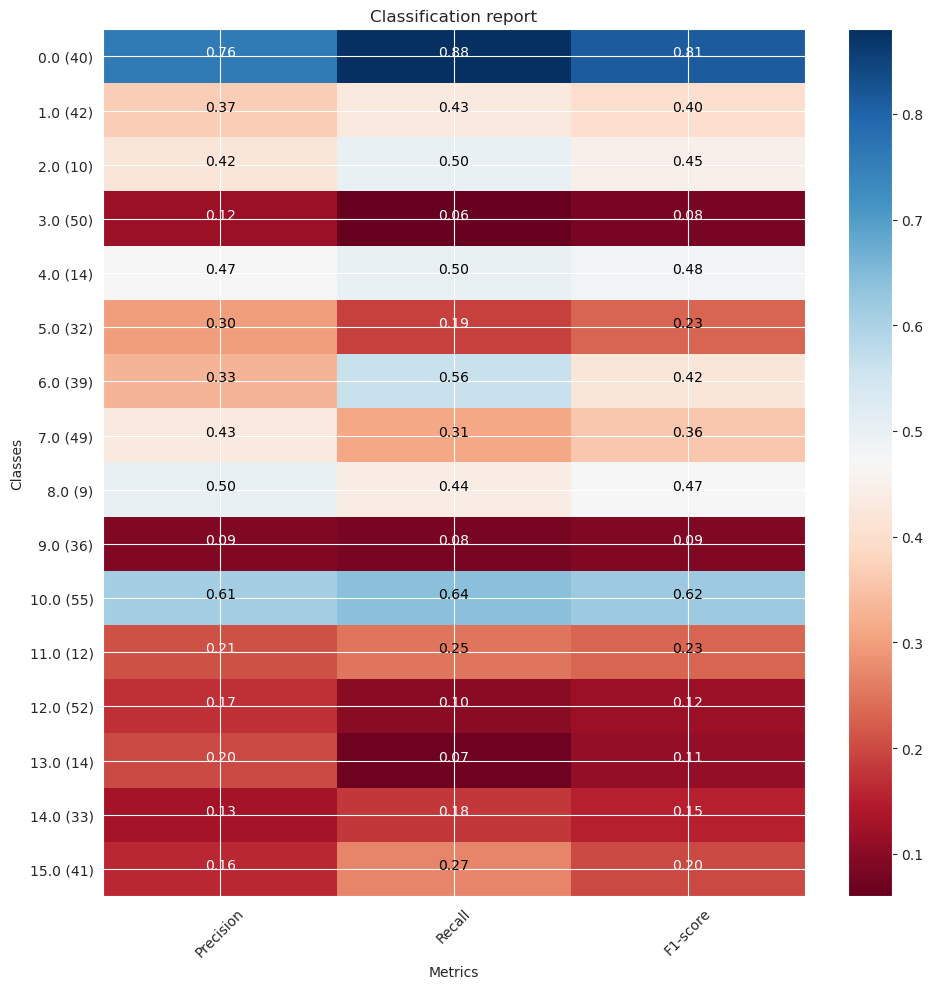

In [20]:
ct_best = study.best_params
model = catboost.CatBoostClassifier(**ct_best, verbose = 0)
model.fit(X_train, y_train)

y_pred = model.predict(X_test)
clf =classification_report(y_test, y_pred)
plot_classification_report(clf)
print(clf)

# LGB

In [21]:
train_y_label = y_train
valid_y_label = y_test
dtrain = lgb.Dataset(X_train, label=train_y_label)

# FYI: Objective functions can take additional arguments
# (https://optuna.readthedocs.io/en/stable/faq.html#objective-func-additional-args).
def objective(trial):
    param = {
        'metric': 'multi_logloss',
        'objective': 'multiclass',
        'num_class': 16,
        'lambda_l1': trial.suggest_loguniform('lambda_l1', 1e-8, 10.0),
        'lambda_l2': trial.suggest_loguniform('lambda_l2', 1e-8, 10.0),
        'num_leaves': trial.suggest_int('num_leaves', 2, 256),
        'feature_fraction': trial.suggest_uniform('feature_fraction', 0.4, 1.0),
        'bagging_fraction': trial.suggest_uniform('bagging_fraction', 0.4, 1.0),
        'bagging_freq': trial.suggest_int('bagging_freq', 1, 7),
        'min_child_samples': trial.suggest_int('min_child_samples', 5, 100),
        'feature_pre_filter' : False
    }

    gbm = lgb.train(param, dtrain)
    preds = gbm.predict(X_test)
    pred_labels = []
    for i in range(0,len(preds)):
        pred_labels.append(np.argmax(preds[i]))
    accuracy = cal_acc(valid_y_label, pred_labels)
    return accuracy

def cal_acc(true, pred):
    return np.mean(true==pred)

study = optuna.create_study(direction="maximize")
study.optimize(objective, n_trials=50)

print("Number of finished trials: {}".format(len(study.trials)))

print("Best trial:")
trial = study.best_trial

print("  Value: {}".format(trial.value))

print("  Params: ")
for key, value in trial.params.items():
    print("    {}: {}".format(key, value))

[I 2024-03-23 21:08:54,979] A new study created in memory with name: no-name-68e2f9a8-5536-4f58-b67d-c7cb2700f9ff


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.017408 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1894
[LightGBM] [Info] Number of data points in the train set: 431, number of used features: 433
[LightGBM] [Info] Start training from score -2.174288
[LightGBM] [Info] Start training from score -2.281918
[LightGBM] [Info] Start training from score -3.501159
[LightGBM] [Info] Start training from score -2.632121
[LightGBM] [Info] Start training from score -3.986667
[LightGBM] [Info] Start training from score -3.070376
[LightGBM] [Info] Start training from score -2.600372
[LightGBM] [Info] Start training from score -2.770271
[LightGBM] [Info] Start training from score -3.427051
[LightGBM] [Info] Start training from score -2.539748
[LightGBM] [Info] Start training from score -2.428522
[LightGBM] [Info] Start training fr

[I 2024-03-23 21:08:58,195] Trial 0 finished with value: 0.32954545454545453 and parameters: {'lambda_l1': 0.5086732547052312, 'lambda_l2': 0.00098847242982118, 'num_leaves': 129, 'feature_fraction': 0.8090047773622897, 'bagging_fraction': 0.41213987774242183, 'bagging_freq': 6, 'min_child_samples': 5}. Best is trial 0 with value: 0.32954545454545453.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-03-23 21:09:00,374] Trial 1 finished with value: 0.3333333333333333 and parameters: {'lambda_l1': 0.007473937428892571, 'lambda_l2': 0.02572382226580809, 'num_leaves': 218, 'feature_fraction': 0.49013099606367017, 'bagging_fraction': 0.701811583727599, 'bagging_freq': 5, 'min_child_samples': 68}. Best is trial 1 with value: 0.3333333333333333.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.019494 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1894
[LightGBM] [Info] Number of data points in the train set: 431, number of used features: 433
[LightGBM] [Info] Start training from score -2.174288
[LightGBM] [Info] Start training from score -2.281918
[LightGBM] [Info] Start training from score -3.501159
[LightGBM] [Info] Start training from score -2.632121
[LightGBM] [Info] Start training from score -3.986667
[LightGBM] [Info] Start training from score -3.070376
[LightGBM] [Info] Start training from score -2.600372
[LightGBM] [Info] Start training from score -2.770271
[LightGBM] [Info] Start training from score -3.427051
[LightGBM] [Info] Start training from score -2.539748
[LightGBM] [Info] Start training from score -2.428522
[LightGBM] [Info] Start training from score -3.6682

[I 2024-03-23 21:09:02,422] Trial 2 finished with value: 0.32196969696969696 and parameters: {'lambda_l1': 0.019149406601678427, 'lambda_l2': 8.672006026893642e-06, 'num_leaves': 177, 'feature_fraction': 0.8575036012912877, 'bagging_fraction': 0.752884645538342, 'bagging_freq': 3, 'min_child_samples': 40}. Best is trial 1 with value: 0.3333333333333333.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-03-23 21:09:04,676] Trial 3 finished with value: 0.3484848484848485 and parameters: {'lambda_l1': 1.3334288501424475e-06, 'lambda_l2': 3.8862009967559955e-07, 'num_leaves': 202, 'feature_fraction': 0.44316185335719566, 'bagging_fraction': 0.8418395905012472, 'bagging_freq': 1, 'min_child_samples': 80}. Best is trial 3 with value: 0.3484848484848485.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-03-23 21:09:05,807] Trial 4 finished with value: 0.3352272727272727 and parameters: {'lambda_l1': 6.805481156284533e-06, 'lambda_l2': 5.7545018035655284e-05, 'num_leaves': 148, 'feature_fraction': 0.730539741358295, 'bagging_fraction': 0.4445815415898944, 'bagging_freq': 2, 'min_child_samples': 58}. Best is trial 3 with value: 0.3484848484848485.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.016850 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1894
[LightGBM] [Info] Number of data points in the train set: 431, number of used features: 433
[LightGBM] [Info] Start training from score -2.174288
[LightGBM] [Info] Start training from score -2.281918
[LightGBM] [Info] Start training from score -3.501159
[LightGBM] [Info] Start training from score -2.632121
[LightGBM] [Info] Start training from score -3.986667
[LightGBM] [Info] Start training from score -3.070376
[LightGBM] [Info] Start training from score -2.600372
[LightGBM] [Info] Start training from score -2.770271
[LightGBM] [Info] Start training from score -3.427051
[LightGBM] [Info] Start training from score -2.539748
[LightGBM] [Info] Start training from score -2.428522
[LightGBM] [Info] Start training from score -3.6682

[I 2024-03-23 21:09:07,219] Trial 5 finished with value: 0.3390151515151515 and parameters: {'lambda_l1': 4.8929646477554074e-08, 'lambda_l2': 3.849537051944016e-07, 'num_leaves': 236, 'feature_fraction': 0.6993684631854853, 'bagging_fraction': 0.8524766993949222, 'bagging_freq': 1, 'min_child_samples': 86}. Best is trial 3 with value: 0.3484848484848485.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-03-23 21:09:08,270] Trial 6 finished with value: 0.3409090909090909 and parameters: {'lambda_l1': 4.565691578232784e-06, 'lambda_l2': 0.011447980801120635, 'num_leaves': 119, 'feature_fraction': 0.9765389327033885, 'bagging_fraction': 0.7083802033895337, 'bagging_freq': 2, 'min_child_samples': 96}. Best is trial 3 with value: 0.3484848484848485.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-03-23 21:09:12,679] Trial 7 finished with value: 0.3522727272727273 and parameters: {'lambda_l1': 4.671332715445447e-07, 'lambda_l2': 0.0068109496494957854, 'num_leaves': 77, 'feature_fraction': 0.7570856936513126, 'bagging_fraction': 0.5776828177361821, 'bagging_freq': 4, 'min_child_samples': 10}. Best is trial 7 with value: 0.3522727272727273.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.018716 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1894
[LightGBM] [Info] Number of data points in the train set: 431, number of used features: 433
[LightGBM] [Info] Start training from score -2.174288
[LightGBM] [Info] Start training from score -2.281918
[LightGBM] [Info] Start training from score -3.501159
[LightGBM] [Info] Start training from score -2.632121
[LightGBM] [Info] Start training from score -3.986667
[LightGBM] [Info] Start training from score -3.070376
[LightGBM] [Info] Start training from score -2.600372
[LightGBM] [Info] Start training from score -2.770271
[LightGBM] [Info] Start training from score -3.427051
[LightGBM] [Info] Start training from score -2.539748
[LightGBM] [Info] Start training from score -2.428522
[LightGBM] [Info] Start training from score -3.6682

[I 2024-03-23 21:09:13,817] Trial 8 finished with value: 0.3352272727272727 and parameters: {'lambda_l1': 0.032447902055486505, 'lambda_l2': 2.4111538487644797, 'num_leaves': 236, 'feature_fraction': 0.8266383763972425, 'bagging_fraction': 0.5443904031045317, 'bagging_freq': 1, 'min_child_samples': 79}. Best is trial 7 with value: 0.3522727272727273.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.017324 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1894
[LightGBM] [Info] Number of data points in the train set: 431, number of used features: 433
[LightGBM] [Info] Start training from score -2.174288
[LightGBM] [Info] Start training from score -2.281918
[LightGBM] [Info] Start training from score -3.501159
[LightGBM] [Info] Start training from score -2.632121
[LightGBM] [Info] Start training from score -3.986667
[LightGBM] [Info] Start training from score -3.070376
[LightGBM] [Info] Start training from score -2.600372
[LightGBM] [Info] Start training from score -2.770271
[LightGBM] [Info] Start training from score -3.427051
[LightGBM] [Info] Start training from score -2.539748
[LightGBM] [Info] Start training from score -2.428522
[LightGBM] [Info] Start training from score -3.6682

[I 2024-03-23 21:09:15,110] Trial 9 finished with value: 0.32196969696969696 and parameters: {'lambda_l1': 0.07688407756362613, 'lambda_l2': 4.255006553131855, 'num_leaves': 95, 'feature_fraction': 0.5917682152960811, 'bagging_fraction': 0.5066113935535156, 'bagging_freq': 3, 'min_child_samples': 93}. Best is trial 7 with value: 0.3522727272727273.


[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.017745 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1894
[LightGBM] [Info] Number of data points in the train set: 431, number of used features: 433
[LightGBM] [Info] Start training from score -2.174288
[LightGBM] [Info] Start training from score -2.281918
[LightGBM] [Info] Start training from score -3.501159
[LightGBM] [Info] Start training from score -2.632121
[LightGBM] [Info] Start training from score -3.986667
[LightGBM] [Info] Start training from score -3.070376
[LightGBM] [Info] Start training from score -2.600372
[LightGBM] [Info] Start training from score -2.770271
[LightGBM] [Info] Start training from score -3.427051
[LightGBM] [Info] Start training from score -2.539748
[LightGBM] [Info] Start training from score -2.428522
[LightGBM] [Info] Start training from score -3.668213
[LightGBM] [Info] Start training from score -2.569601
[LightG

[I 2024-03-23 21:09:21,376] Trial 10 finished with value: 0.32765151515151514 and parameters: {'lambda_l1': 1.519770133128227e-08, 'lambda_l2': 1.0165501580732938e-08, 'num_leaves': 19, 'feature_fraction': 0.6064523327471081, 'bagging_fraction': 0.9764338966383244, 'bagging_freq': 7, 'min_child_samples': 5}. Best is trial 7 with value: 0.3522727272727273.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.017232 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1894
[LightGBM] [Info] Number of data points in the train set: 431,

[I 2024-03-23 21:09:24,422] Trial 11 finished with value: 0.3390151515151515 and parameters: {'lambda_l1': 4.426575163585092e-06, 'lambda_l2': 5.4090124001353325e-06, 'num_leaves': 51, 'feature_fraction': 0.4248055323938485, 'bagging_fraction': 0.5963623804800484, 'bagging_freq': 4, 'min_child_samples': 30}. Best is trial 7 with value: 0.3522727272727273.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.017944 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1894
[LightGBM] [Info] Number of data points in the train set: 431, number of used features: 433
[LightGBM] [Info] Start training from score -2.174288
[LightGBM] [Info] Start training from score -2.281918
[LightGBM] [Info] Start training from score -3.501159
[LightGBM] [Info] Start training from score -2.632121
[LightGBM] [Info] Start training from score -3.986667
[LightGBM] [Info] Start training from score -3.070376
[LightGBM] [Info] Start training from score -2.600372
[LightGBM] [Info] Start training from score -2.770271
[LightGBM] [Info] Start training from score -3.427051
[LightGBM] [Info] Start training from score -2.539748
[LightGBM] [Info] Start training from score -2.428522
[LightGBM] [Info] Start training from score -3.6682

[I 2024-03-23 21:09:27,347] Trial 12 finished with value: 0.32575757575757575 and parameters: {'lambda_l1': 0.00012690765218997964, 'lambda_l2': 0.000486311215743068, 'num_leaves': 71, 'feature_fraction': 0.4026031432114902, 'bagging_fraction': 0.6086267779362601, 'bagging_freq': 5, 'min_child_samples': 30}. Best is trial 7 with value: 0.3522727272727273.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-03-23 21:09:29,726] Trial 13 finished with value: 0.3446969696969697 and parameters: {'lambda_l1': 2.476274236182943e-07, 'lambda_l2': 1.2350424529884723e-07, 'num_leaves': 179, 'feature_fraction': 0.5308796356053662, 'bagging_fraction': 0.811111659083954, 'bagging_freq': 4, 'min_child_samples': 71}. Best is trial 7 with value: 0.3522727272727273.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.017062 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1894
[LightGBM] [Info] Number of data points in the train set: 431, number of used features: 433
[LightGBM] [Info] Start training from score -2.174288
[LightGBM] [Info] Start training from score -2.281918
[LightGBM] [Info] Start training from score -3.501159
[LightGBM] [Info] Start training from score -2.632121
[LightGBM] [Info] Start training from score -3.986667
[LightGBM] [Info] Start training from score -3.070376
[LightGBM] [Info] Start training from score -2.600372
[LightGBM] [Info] Start training from score -2.770271
[LightGBM] [Info] Start training from score -3.427051
[LightGBM] [Info] Start training from score -2.539748
[LightGBM] [Info] Start training from score -2.428522
[LightGBM] [Info] Start training from score -3.6682

[I 2024-03-23 21:09:30,629] Trial 14 finished with value: 0.16666666666666666 and parameters: {'lambda_l1': 7.4882859892467994, 'lambda_l2': 3.2494547165882072e-06, 'num_leaves': 10, 'feature_fraction': 0.6553293436191283, 'bagging_fraction': 0.6259088383220233, 'bagging_freq': 7, 'min_child_samples': 48}. Best is trial 7 with value: 0.3522727272727273.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-03-23 21:09:36,347] Trial 15 finished with value: 0.3106060606060606 and parameters: {'lambda_l1': 2.558484800782187e-07, 'lambda_l2': 1.1694565495826732e-08, 'num_leaves': 184, 'feature_fraction': 0.5163333787730089, 'bagging_fraction': 0.8863127595297867, 'bagging_freq': 2, 'min_child_samples': 19}. Best is trial 7 with value: 0.3522727272727273.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.016929 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1894
[LightGBM] [Info] Number of data points in the train set: 431, number of used features: 433
[LightGBM] [Info] Start training from score -2.174288
[LightGBM] [Info] Start training from score -2.281918
[LightGBM] [Info] Start training from score -3.501159
[LightGBM] [Info] Start training from score -2.632121
[LightGBM] [Info] Start training from score -3.986667
[LightGBM] [Info] Start training from score -3.070376
[LightGBM] [Info] Start training from score -2.600372
[LightGBM] [Info] Start training from score -2.770271
[LightGBM] [Info] Start training from score -3.427051
[LightGBM] [Info] Start training from score -2.539748
[LightGBM] [Info] Start training from score -2.428522
[LightGBM] [Info] Start training from score -3.6682

[I 2024-03-23 21:09:38,026] Trial 16 finished with value: 0.32575757575757575 and parameters: {'lambda_l1': 6.723785724344228e-05, 'lambda_l2': 9.487086069864707e-05, 'num_leaves': 53, 'feature_fraction': 0.7554122521961938, 'bagging_fraction': 0.7568512419855908, 'bagging_freq': 3, 'min_child_samples': 60}. Best is trial 7 with value: 0.3522727272727273.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-03-23 21:09:40,945] Trial 17 finished with value: 0.3333333333333333 and parameters: {'lambda_l1': 4.39074222559969e-07, 'lambda_l2': 0.006601256036054528, 'num_leaves': 95, 'feature_fraction': 0.6399901915616062, 'bagging_fraction': 0.6472112018121641, 'bagging_freq': 5, 'min_child_samples': 19}. Best is trial 7 with value: 0.3522727272727273.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.020765 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if mem

[I 2024-03-23 21:09:44,768] Trial 18 finished with value: 0.3143939393939394 and parameters: {'lambda_l1': 0.0009372720127047301, 'lambda_l2': 0.1056431542589191, 'num_leaves': 156, 'feature_fraction': 0.5920596639001814, 'bagging_fraction': 0.9970912052159464, 'bagging_freq': 1, 'min_child_samples': 47}. Best is trial 7 with value: 0.3522727272727273.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.017686 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1894
[LightGBM] [Info] Number of data points in the train set: 431, number of used features: 433
[LightGBM] [Info] Start training from score -2.174288
[LightGBM] [Info] Start training from score -2.281918
[LightGBM] [Info] Start training from score -3.501159
[LightGBM] [Info] Start training from score -2.632121
[LightGBM] [Info] Start training from score -3.986667
[LightGBM] [Info] Start training from score -3.070376
[LightGBM] [Info] Start training from score -2.600372
[LightGBM] [Info] Start training from score -2.770271
[LightGBM] [Info] Start training from score -3.427051
[LightGBM] [Info] Start training from score -2.539748
[LightGBM] [Info] Start training from score -2.428522
[LightGBM] [Info] Start training from score -3.6682

[I 2024-03-23 21:09:46,634] Trial 19 finished with value: 0.3371212121212121 and parameters: {'lambda_l1': 1.2292545970268759e-08, 'lambda_l2': 0.00046991641925538016, 'num_leaves': 210, 'feature_fraction': 0.44619180016840265, 'bagging_fraction': 0.6689591337566563, 'bagging_freq': 3, 'min_child_samples': 78}. Best is trial 7 with value: 0.3522727272727273.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-03-23 21:09:48,906] Trial 20 finished with value: 0.3390151515151515 and parameters: {'lambda_l1': 3.055905597523437e-05, 'lambda_l2': 0.16493591829862483, 'num_leaves': 106, 'feature_fraction': 0.5407300464200177, 'bagging_fraction': 0.5675800999439055, 'bagging_freq': 6, 'min_child_samples': 37}. Best is trial 7 with value: 0.3522727272727273.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-03-23 21:09:51,298] Trial 21 finished with value: 0.3371212121212121 and parameters: {'lambda_l1': 6.583160778266497e-07, 'lambda_l2': 1.7586701596207924e-07, 'num_leaves': 196, 'feature_fraction': 0.47449022445381767, 'bagging_fraction': 0.8132548424945603, 'bagging_freq': 4, 'min_child_samples': 69}. Best is trial 7 with value: 0.3522727272727273.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.017687 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1894
[LightGBM] [Info] Number of data points in the train set: 431, number of used features: 433
[LightGBM] [Info] Start training from score -2.174288
[LightGBM] [Info] Start training from score -2.281918
[LightGBM] [Info] Start training from score -3.501159
[LightGBM] [Info] Start training from score -2.632121
[LightGBM] [Info] Start training from score -3.986667
[LightGBM] [Info] Start training from score -3.070376
[LightGBM] [Info] Start training from score -2.600372
[LightGBM] [Info] Start training from score -2.770271
[LightGBM] [Info] Start training from score -3.427051
[LightGBM] [Info] Start training from score -2.539748
[LightGBM] [Info] Start training from score -2.428522
[LightGBM] [Info] Start training from score -3.6682

[I 2024-03-23 21:09:53,646] Trial 22 finished with value: 0.3352272727272727 and parameters: {'lambda_l1': 1.2283229817694735e-07, 'lambda_l2': 1.5740576073709612e-07, 'num_leaves': 159, 'feature_fraction': 0.5307290878741298, 'bagging_fraction': 0.7909190804886124, 'bagging_freq': 4, 'min_child_samples': 71}. Best is trial 7 with value: 0.3522727272727273.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.017016 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1894
[LightGBM] [Info] Number of data points in the train set: 431, number of used features: 433
[LightGBM] [Info] Start training from score -2.174288
[LightGBM] [Info] Start training from score -2.281918
[LightGBM] [Info] Start training from score -3.501159
[LightGBM] [Info] Start training from score -2.632121
[LightGBM] [Info] Start training from score -3.986667
[LightGBM] [Info] Start training from score -3.070376
[LightGBM] [Info] Start training from score -2.600372
[LightGBM] [Info] Start training from score -2.770271
[LightGBM] [Info] Start training from score -3.427051
[LightGBM] [Info] Start training from score -2.539748
[LightGBM] [Info] Start training from score -2.428522
[LightGBM] [Info] Start training from score -3.6682

[I 2024-03-23 21:09:56,088] Trial 23 finished with value: 0.3352272727272727 and parameters: {'lambda_l1': 1.5129956485965302e-06, 'lambda_l2': 9.315448938927672e-07, 'num_leaves': 179, 'feature_fraction': 0.4739157616760608, 'bagging_fraction': 0.8985873025608753, 'bagging_freq': 6, 'min_child_samples': 85}. Best is trial 7 with value: 0.3522727272727273.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.017422 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1894
[LightGBM] [Info] Number of data points in the train set: 431, number of used features: 433
[LightGBM] [Info] Start training from score -2.174288
[LightGBM] [Info] Start training from score -2.281918
[LightGBM] [Info] Start training from score -3.501159
[LightGBM] [Info] Start training from score -2.632121
[LightGBM] [Info] Start training from score -3.986667
[LightGBM] [Info] Start training from score -3.070376
[LightGBM] [Info] Start training from score -2.600372
[LightGBM] [Info] Start training from score -2.770271
[LightGBM] [Info] Start training from score -3.427051
[LightGBM] [Info] Start training from score -2.539748
[LightGBM] [Info] Start training from score -2.428522
[LightGBM] [Info] Start training from score -3.6682

[I 2024-03-23 21:09:58,941] Trial 24 finished with value: 0.3314393939393939 and parameters: {'lambda_l1': 9.210969158157164e-08, 'lambda_l2': 2.4691356125771604e-05, 'num_leaves': 254, 'feature_fraction': 0.5575421268914408, 'bagging_fraction': 0.8297093044564883, 'bagging_freq': 5, 'min_child_samples': 59}. Best is trial 7 with value: 0.3522727272727273.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.017803 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1894
[LightGBM] [Info] Number of data points in the train set: 431, number of used features: 433
[LightGBM] [Info] Start training from score -2.174288
[LightGBM] [Info] Start training from score -2.281918
[LightGBM] [Info] Start training from score -3.501159
[LightGBM] [Info] Start training from score -2.632121
[LightGBM] [Info] Start training from score -3.986667
[LightGBM] [Info] Start training from score -3.070376
[LightGBM] [Info] Start training from score -2.600372
[LightGBM] [Info] Start training from score -2.770271
[LightGBM] [Info] Start training from score -3.427051
[LightGBM] [Info] Start training from score -2.539748
[LightGBM] [Info] Start training from score -2.428522
[LightGBM] [Info] Start training from score -3.6682

[I 2024-03-23 21:10:01,068] Trial 25 finished with value: 0.3371212121212121 and parameters: {'lambda_l1': 1.2768191161657172e-06, 'lambda_l2': 1.542280669886121e-06, 'num_leaves': 140, 'feature_fraction': 0.40902441779483395, 'bagging_fraction': 0.7469420766528962, 'bagging_freq': 2, 'min_child_samples': 77}. Best is trial 7 with value: 0.3522727272727273.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-03-23 21:10:02,799] Trial 26 finished with value: 0.3522727272727273 and parameters: {'lambda_l1': 2.557384781223002e-05, 'lambda_l2': 8.647095473838866e-08, 'num_leaves': 75, 'feature_fraction': 0.47893070879351685, 'bagging_fraction': 0.6741153630290575, 'bagging_freq': 4, 'min_child_samples': 89}. Best is trial 7 with value: 0.3522727272727273.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-03-23 21:10:04,495] Trial 27 finished with value: 0.3314393939393939 and parameters: {'lambda_l1': 2.2714669964026225e-05, 'lambda_l2': 6.067578366307677e-08, 'num_leaves': 80, 'feature_fraction': 0.4497304810833627, 'bagging_fraction': 0.6538376579768773, 'bagging_freq': 3, 'min_child_samples': 98}. Best is trial 7 with value: 0.3522727272727273.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-03-23 21:10:06,250] Trial 28 finished with value: 0.3409090909090909 and parameters: {'lambda_l1': 0.00047883106922343464, 'lambda_l2': 6.320784585535689e-07, 'num_leaves': 38, 'feature_fraction': 0.48317671879987445, 'bagging_fraction': 0.6908096163479405, 'bagging_freq': 5, 'min_child_samples': 89}. Best is trial 7 with value: 0.3522727272727273.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.017474 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1894
[LightGBM] [Info] Number of data points in the train set: 431, number of used features: 433
[LightGBM] [Info] Start training from score -2.174288
[LightGBM] [Info] Start training from score -2.281918
[LightGBM] [Info] Start training from score -3.501159
[LightGBM] [Info] Start training from score -2.632121
[LightGBM] [Info] Start training from score -3.986667
[LightGBM] [Info] Start training from score -3.070376
[LightGBM] [Info] Start training from score -2.600372
[LightGBM] [Info] Start training from score -2.770271
[LightGBM] [Info] Start training from score -3.427051
[LightGBM] [Info] Start training from score -2.539748
[LightGBM] [Info] Start training from score -2.428522
[LightGBM] [Info] Start training from score -3.6682

[I 2024-03-23 21:10:07,273] Trial 29 finished with value: 0.32954545454545453 and parameters: {'lambda_l1': 1.4993557164307889e-05, 'lambda_l2': 0.001519813603091357, 'num_leaves': 127, 'feature_fraction': 0.6681224174254132, 'bagging_fraction': 0.501720015512435, 'bagging_freq': 4, 'min_child_samples': 81}. Best is trial 7 with value: 0.3522727272727273.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-03-23 21:10:13,454] Trial 30 finished with value: 0.3428030303030303 and parameters: {'lambda_l1': 3.0146406111266987e-06, 'lambda_l2': 1.3249181112108485e-05, 'num_leaves': 72, 'feature_fraction': 0.4440256098333227, 'bagging_fraction': 0.5900990920425984, 'bagging_freq': 6, 'min_child_samples': 10}. Best is trial 7 with value: 0.3522727272727273.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.082812 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1894
[LightGBM] [Info] Number of data points in the train set: 431, number of used features: 433
[LightGBM] [Info] Start training from score -2.174288
[LightGBM] [Info] Start training from score -2.281918
[LightGBM] [Info] Start training from score -3.501159
[LightGBM] [Info] Start training from score -2.632121
[LightGBM] [Info] Start training from score -3.986667
[LightGBM] [Info] Start training from score -3.070376
[LightGBM] [Info] Start training from score -2.600372
[LightGBM] [Info] Start training from score -2.770271
[LightGBM] [Info] Start training from score -3.427051
[LightGBM] [Info] Start training from score -2.539748
[LightGBM] [Info] Start training from score -2.428522
[LightGBM] [Info] Start training from score -3.6682

[I 2024-03-23 21:10:16,746] Trial 31 finished with value: 0.3371212121212121 and parameters: {'lambda_l1': 5.060438387240597e-07, 'lambda_l2': 5.0783645969719306e-08, 'num_leaves': 206, 'feature_fraction': 0.5293388968281142, 'bagging_fraction': 0.7853627518508246, 'bagging_freq': 4, 'min_child_samples': 72}. Best is trial 7 with value: 0.3522727272727273.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-03-23 21:10:19,694] Trial 32 finished with value: 0.3390151515151515 and parameters: {'lambda_l1': 1.3650699838503204e-06, 'lambda_l2': 1.90155673644763e-06, 'num_leaves': 166, 'feature_fraction': 0.4907414137094846, 'bagging_fraction': 0.7130225021161773, 'bagging_freq': 4, 'min_child_samples': 64}. Best is trial 7 with value: 0.3522727272727273.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-03-23 21:10:21,845] Trial 33 finished with value: 0.3465909090909091 and parameters: {'lambda_l1': 1.9590179270158444e-07, 'lambda_l2': 8.306083176197455e-08, 'num_leaves': 228, 'feature_fraction': 0.5695924641924063, 'bagging_fraction': 0.7308379127182963, 'bagging_freq': 3, 'min_child_samples': 91}. Best is trial 7 with value: 0.3522727272727273.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-03-23 21:10:23,424] Trial 34 finished with value: 0.3503787878787879 and parameters: {'lambda_l1': 1.0689357701885383e-05, 'lambda_l2': 2.9795639197607425e-08, 'num_leaves': 229, 'feature_fraction': 0.7753119632017484, 'bagging_fraction': 0.6803140880613001, 'bagging_freq': 3, 'min_child_samples': 90}. Best is trial 7 with value: 0.3522727272727273.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.034343 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1894
[LightGBM] [Info] Number of data points in the train set: 431, number of used features: 433
[LightGBM] [Info] Start training from score -2.174288
[LightGBM] [Info] Start training from score -2.281918
[LightGBM] [Info] Start training from score -3.501159
[LightGBM] [Info] Start training from score -2.632121
[LightGBM] [Info] Start training from score -3.986667
[LightGBM] [Info] Start training from score -3.070376
[LightGBM] [Info] Start training from score -2.600372
[LightGBM] [Info] Start training from score -2.770271
[LightGBM] [Info] Start training from score -3.427051
[LightGBM] [Info] Start training from score -2.539748
[LightGBM] [Info] Start training from score -2.428522
[LightGBM] [Info] Start training from score -3.6682

[I 2024-03-23 21:10:24,703] Trial 35 finished with value: 0.32954545454545453 and parameters: {'lambda_l1': 9.40058013152496e-06, 'lambda_l2': 2.4951430999699963e-08, 'num_leaves': 253, 'feature_fraction': 0.792624482989617, 'bagging_fraction': 0.6830624295077989, 'bagging_freq': 2, 'min_child_samples': 98}. Best is trial 7 with value: 0.3522727272727273.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-03-23 21:10:26,737] Trial 36 finished with value: 0.3428030303030303 and parameters: {'lambda_l1': 9.133761629366973e-05, 'lambda_l2': 3.398188774165807e-07, 'num_leaves': 221, 'feature_fraction': 0.7243589594807396, 'bagging_fraction': 0.6258983953378864, 'bagging_freq': 1, 'min_child_samples': 53}. Best is trial 7 with value: 0.3522727272727273.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.077525 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1894
[LightGBM] [Info] Number of data points in the train set: 431, number of used features: 433
[LightGBM] [Info] Start training from score -2.174288
[LightGBM] [Info] Start training from score -2.281918
[LightGBM] [Info] Start training from score -3.501159
[LightGBM] [Info] Start training from score -2.632121
[LightGBM] [Info] Start training from score -3.986667
[LightGBM] [Info] Start training from score -3.070376
[LightGBM] [Info] Start training from score -2.600372
[LightGBM] [Info] Start training from score -2.770271
[LightGBM] [Info] Start training from score -3.427051
[LightGBM] [Info] Start training from score -2.539748
[LightGBM] [Info] Start training from score -2.428522
[LightGBM] [Info] Start training from score -3.6682

[I 2024-03-23 21:10:28,193] Trial 37 finished with value: 0.3333333333333333 and parameters: {'lambda_l1': 6.530733170273801e-06, 'lambda_l2': 3.4502264165223406e-07, 'num_leaves': 114, 'feature_fraction': 0.6921861203975014, 'bagging_fraction': 0.6699201454554534, 'bagging_freq': 3, 'min_child_samples': 85}. Best is trial 7 with value: 0.3522727272727273.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.020260 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1894
[LightGBM] [Info] Number of data points in the train set: 431, number of used features: 433
[LightGBM] [Info] Start training from score -2.174288
[LightGBM] [Info] Start training from score -2.281918
[LightGBM] [Info] Start training from score -3.501159
[LightGBM] [Info] Start training from score -2.632121
[LightGBM] [Info] Start training from score -3.986667
[LightGBM] [Info] Start training from score -3.070376
[LightGBM] [Info] Start training from score -2.600372
[LightGBM] [Info] Start training from score -2.770271
[LightGBM] [Info] Start training from score -3.427051
[LightGBM] [Info] Start training from score -2.539748
[LightGBM] [Info] Start training from score -2.428522
[LightGBM] [Info] Start training from score -3.6682

[I 2024-03-23 21:10:29,560] Trial 38 finished with value: 0.32765151515151514 and parameters: {'lambda_l1': 4.584993018348985e-08, 'lambda_l2': 3.389966095219196e-08, 'num_leaves': 138, 'feature_fraction': 0.7677002497374938, 'bagging_fraction': 0.711216181429574, 'bagging_freq': 2, 'min_child_samples': 91}. Best is trial 7 with value: 0.3522727272727273.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.018252 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1894
[LightGBM] [Info] Number of data points in the train set: 431, number of used features: 433
[LightGBM] [Info] Start training from score -2.174288
[LightGBM] [Info] Start training from score -2.281918
[LightGBM] [Info] Start training from score -3.501159
[LightGBM] [Info] Start training from score -2.632121
[LightGBM] [Info] Start training from score -3.986667
[LightGBM] [Info] Start training from score -3.070376
[LightGBM] [Info] Start training from score -2.600372
[LightGBM] [Info] Start training from score -2.770271
[LightGBM] [Info] Start training from score -3.427051
[LightGBM] [Info] Start training from score -2.539748
[LightGBM] [Info] Start training from score -2.428522
[LightGBM] [Info] Start training from score -3.6682

[I 2024-03-23 21:10:30,945] Trial 39 finished with value: 0.32386363636363635 and parameters: {'lambda_l1': 2.3999481984447226e-06, 'lambda_l2': 9.838613128821481e-05, 'num_leaves': 27, 'feature_fraction': 0.8488083499930388, 'bagging_fraction': 0.6415701585948465, 'bagging_freq': 1, 'min_child_samples': 82}. Best is trial 7 with value: 0.3522727272727273.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.018523 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1894
[LightGBM] [Info] Number of data points in the train set: 431, number of used features: 433
[LightGBM] [Info] Start training from score -2.174288
[LightGBM] [Info] Start training from score -2.281918
[LightGBM] [Info] Start training from score -3.501159
[LightGBM] [Info] Start training from score -2.632121
[LightGBM] [Info] Start training from score -3.986667
[LightGBM] [Info] Start training from score -3.070376
[LightGBM] [Info] Start training from score -2.600372
[LightGBM] [Info] Start training from score -2.770271
[LightGBM] [Info] Start training from score -3.427051
[LightGBM] [Info] Start training from score -2.539748
[LightGBM] [Info] Start training from score -2.428522
[LightGBM] [Info] Start training from score -3.6682

[I 2024-03-23 21:10:32,286] Trial 40 finished with value: 0.3371212121212121 and parameters: {'lambda_l1': 1.331352040801701e-05, 'lambda_l2': 7.034736014335391e-06, 'num_leaves': 54, 'feature_fraction': 0.6251933176106874, 'bagging_fraction': 0.5551205272592766, 'bagging_freq': 5, 'min_child_samples': 100}. Best is trial 7 with value: 0.3522727272727273.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-03-23 21:10:34,513] Trial 41 finished with value: 0.3409090909090909 and parameters: {'lambda_l1': 9.310862308289551e-07, 'lambda_l2': 8.756911428272664e-08, 'num_leaves': 234, 'feature_fraction': 0.5675395767421657, 'bagging_fraction': 0.7311485636382598, 'bagging_freq': 3, 'min_child_samples': 92}. Best is trial 7 with value: 0.3522727272727273.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.030974 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1894
[LightGBM] [Info] Number of data points in the train set: 431, number of used features: 433
[LightGBM] [Info] Start training from score -2.174288
[LightGBM] [Info] Start training from score -2.281918
[LightGBM] [Info] Start training from score -3.501159
[LightGBM] [Info] Start training from score -2.632121
[LightGBM] [Info] Start training from score -3.986667
[LightGBM] [Info] Start training from score -3.070376
[LightGBM] [Info] Start training from score -2.600372
[LightGBM] [Info] Start training from score -2.770271
[LightGBM] [Info] Start training from score -3.427051
[LightGBM] [Info] Start training from score -2.539748
[LightGBM] [Info] Start training from score -2.428522
[LightGBM] [Info] Start training from score -3.6682

[I 2024-03-23 21:10:36,159] Trial 42 finished with value: 0.3409090909090909 and parameters: {'lambda_l1': 2.3930104114532054e-06, 'lambda_l2': 1.8303015478976604e-08, 'num_leaves': 225, 'feature_fraction': 0.8149335456478928, 'bagging_fraction': 0.7387424996680976, 'bagging_freq': 3, 'min_child_samples': 88}. Best is trial 7 with value: 0.3522727272727273.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.017003 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1894
[LightGBM] [Info] Number of data points in the train set: 431, number of used features: 433
[LightGBM] [Info] Start training from score -2.174288
[LightGBM] [Info] Start training from score -2.281918
[LightGBM] [Info] Start training from score -3.501159
[LightGBM] [Info] Start training from score -2.632121
[LightGBM] [Info] Start training from score -3.986667
[LightGBM] [Info] Start training from score -3.070376
[LightGBM] [Info] Start training from score -2.600372
[LightGBM] [Info] Start training from score -2.770271
[LightGBM] [Info] Start training from score -3.427051
[LightGBM] [Info] Start training from score -2.539748
[LightGBM] [Info] Start training from score -2.428522
[LightGBM] [Info] Start training from score -3.6682

[I 2024-03-23 21:10:37,562] Trial 43 finished with value: 0.3390151515151515 and parameters: {'lambda_l1': 6.032727650601399e-06, 'lambda_l2': 3.7515503736720545e-08, 'num_leaves': 239, 'feature_fraction': 0.7214575697817558, 'bagging_fraction': 0.6867346831942746, 'bagging_freq': 4, 'min_child_samples': 94}. Best is trial 7 with value: 0.3522727272727273.


[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.019815 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1894
[LightGBM] [Info] Number of data points in the train set: 431, number of used features: 433
[LightGBM] [Info] Start training from score -2.174288
[LightGBM] [Info] Start training from score -2.281918
[LightGBM] [Info] Start training from score -3.501159
[LightGBM] [Info] Start training from score -2.632121
[LightGBM] [Info] Start training from score -3.986667
[LightGBM] [Info] Start training from score -3.070376
[LightGBM] [Info] Start training from score -2.600372
[LightGBM] [Info] Start training from score -2.770271
[LightGBM] [Info] Start training from score -3.427051
[LightGBM] [Info] Start training from score -2.539748
[LightGBM] [Info] Start training from score -2.428522
[LightGBM] [Info] Start training from score -3.668213
[LightGBM] [Info] Start training from score -2.569601
[LightG

[I 2024-03-23 21:10:39,412] Trial 44 finished with value: 0.3371212121212121 and parameters: {'lambda_l1': 2.3326529257788578e-07, 'lambda_l2': 2.3359250226243263e-07, 'num_leaves': 198, 'feature_fraction': 0.8926968786123664, 'bagging_fraction': 0.6134288465156508, 'bagging_freq': 2, 'min_child_samples': 84}. Best is trial 7 with value: 0.3522727272727273.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.029525 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if mem

[I 2024-03-23 21:10:42,268] Trial 45 finished with value: 0.3333333333333333 and parameters: {'lambda_l1': 3.901323826905206e-08, 'lambda_l2': 6.457886251425088e-07, 'num_leaves': 84, 'feature_fraction': 0.5016120745475692, 'bagging_fraction': 0.7113190278477399, 'bagging_freq': 3, 'min_child_samples': 74}. Best is trial 7 with value: 0.3522727272727273.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.018329 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1894
[LightGBM] [Info] Number of data points in the train set: 431, number of used features: 433
[LightGBM] [Info] Start training from score -2.174288
[LightGBM] [Info] Start training from score -2.281918
[LightGBM] [Info] Start training from score -3.501159
[LightGBM] [Info] Start training from score -2.632121
[LightGBM] [Info] Start training from score -3.986667
[LightGBM] [Info] Start training from score -3.070376
[LightGBM] [Info] Start training from score -2.600372
[LightGBM] [Info] Start training from score -2.770271
[LightGBM] [Info] Start training from score -3.427051
[LightGBM] [Info] Start training from score -2.539748
[LightGBM] [Info] Start training from score -2.428522
[LightGBM] [Info] Start training from score -3.6682

[I 2024-03-23 21:10:44,252] Trial 46 finished with value: 0.3333333333333333 and parameters: {'lambda_l1': 2.5362439853991045e-05, 'lambda_l2': 8.813512199238493e-08, 'num_leaves': 240, 'feature_fraction': 0.6796315452924298, 'bagging_fraction': 0.7625958170091277, 'bagging_freq': 5, 'min_child_samples': 95}. Best is trial 7 with value: 0.3522727272727273.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.023155 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1894
[LightGBM] [Info] Number of data points in the train set: 431, number of used features: 433
[LightGBM] [Info] Start training from score -2.174288
[LightGBM] [Info] Start training from score -2.281918
[LightGBM] [Info] Start training from score -3.501159
[LightGBM] [Info] Start training from score -2.632121
[LightGBM] [Info] Start training from score -3.986667
[LightGBM] [Info] Start training from score -3.070376
[LightGBM] [Info] Start training from score -2.600372
[LightGBM] [Info] Start training from score -2.770271
[LightGBM] [Info] Start training from score -3.427051
[LightGBM] [Info] Start training from score -2.539748
[LightGBM] [Info] Start training from score -2.428522
[LightGBM] [Info] Start training from score -3.6682

[I 2024-03-23 21:10:46,235] Trial 47 finished with value: 0.3390151515151515 and parameters: {'lambda_l1': 5.316405545784781e-07, 'lambda_l2': 1.4097979211340338e-08, 'num_leaves': 216, 'feature_fraction': 0.7033441362467542, 'bagging_fraction': 0.647096791865416, 'bagging_freq': 4, 'min_child_samples': 66}. Best is trial 7 with value: 0.3522727272727273.


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.046629 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1894
[LightGBM] [Info] Number of data points in the train set: 431, number of used features: 433
[LightGBM] [Info] Start training from score -2.174288
[LightGBM] [Info] Start training from score -2.281918
[LightGBM] [Info] Start training from score -3.501159
[LightGBM] [Info] Start training from score -2.632121
[LightGBM] [Info] Start training from score -3.986667
[LightGBM] [Info] Start training from score -3.070376
[LightGBM] [Info] Start training from score -2.600372
[LightGBM] [Info] Start training from score -2.770271
[LightGBM] [Info] Start training from score -3.427051
[LightGBM] [Info] Start training from score -2.539748
[LightGBM] [Info] Start training from score -2.428522
[LightGBM] [Info] Start training from score -3.6682

[I 2024-03-23 21:10:48,597] Trial 48 finished with value: 0.32954545454545453 and parameters: {'lambda_l1': 4.134161798202311e-06, 'lambda_l2': 1.1477682977299145e-07, 'num_leaves': 189, 'feature_fraction': 0.5665889405731751, 'bagging_fraction': 0.5797865396368286, 'bagging_freq': 2, 'min_child_samples': 77}. Best is trial 7 with value: 0.3522727272727273.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-03-23 21:10:51,157] Trial 49 finished with value: 0.32386363636363635 and parameters: {'lambda_l1': 1.1469634800043902e-07, 'lambda_l2': 1.0883527725795085e-08, 'num_leaves': 64, 'feature_fraction': 0.6094923473842979, 'bagging_fraction': 0.5370268700475976, 'bagging_freq': 3, 'min_child_samples': 37}. Best is trial 7 with value: 0.3522727272727273.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] lambda_l1 is set=4.671332715445447e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.671332715445447e-07
[LightGBM] [Warning] bagging_fraction is set=0.5776828177361821, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5776828177361821
[LightGBM] [Warning] lambda_l2 is set=0.0068109496494957854, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0068109496494957854
[LightGBM] [Warning] feature_fraction is set=0.7570856936513126, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7570856936513126
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
              precision    recall  f1-score   support

         0.0       0.73      0.90      0.81        40
         1.0       0.30      0.38      0.34        42
         2.0       0.38      0.50      0.43        10
         3.0       0.14      0.06      0.08        50
         4.0       0.71      0.36      0.

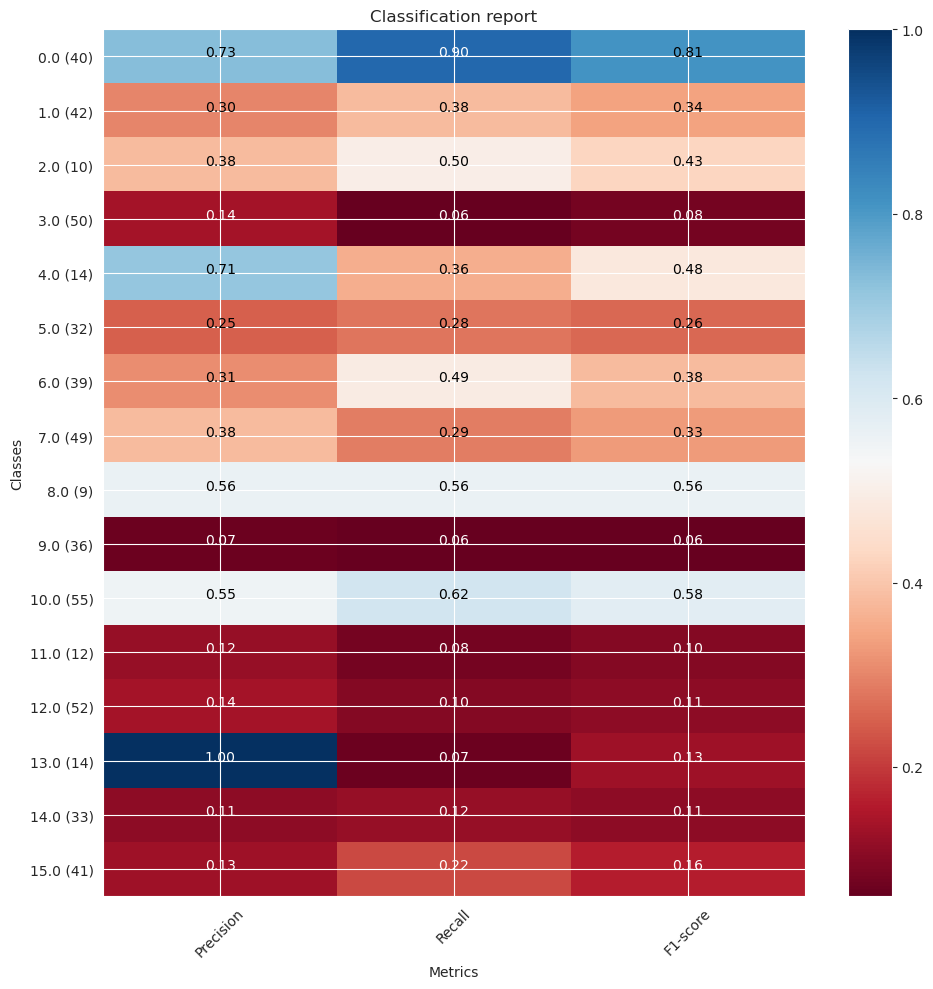

In [22]:
lgb_best = study.best_params
model = lgb.LGBMClassifier(**lgb_best)
model.fit(X_train, train_y_label)
y_pred = model.predict(X_test)
clf =classification_report(valid_y_label, y_pred)
plot_classification_report(clf)
print(clf)

# XGB

In [23]:
train_y_label = y_train
valid_y_label = y_test
train_x_tr, valid_x_es, train_y_tr, valid_y_es = train_test_split(X_train, train_y_label, test_size=0.2)

dtrain = xgb.DMatrix(train_x_tr, label=train_y_tr)
dtest = xgb.DMatrix(X_test, label=valid_y_label)

def objective(trial):

    param = {
        "verbosity": 0,
        # use exact for small dataset.
        "tree_method": "exact",
        # defines booster, gblinear for linear functions.
        "booster": trial.suggest_categorical("booster", ["gbtree", "gblinear", "dart"]),
        # L2 regularization weight.
        "lambda": trial.suggest_float("lambda", 1e-8, 1.0, log=True),
        # L1 regularization weight.
        "alpha": trial.suggest_float("alpha", 1e-8, 1.0, log=True),
        # sampling ratio for training data.
        "subsample": trial.suggest_float("subsample", 0.2, 1.0),
        # sampling according to each tree.
        "colsample_bytree": trial.suggest_float("colsample_bytree", 0.2, 1.0),
        "early_stopping_rounds":200,
        "objective": 'multi:softmax',
        'num_class': 16,
        "evals":([valid_x_es,valid_y_es])
    }

    if param["booster"] in ["gbtree", "dart"]:
        # maximum depth of the tree, signifies complexity of the tree.
        param["max_depth"] = trial.suggest_int("max_depth", 3, 9, step=2)
        # minimum child weight, larger the term more conservative the tree.
        param["min_child_weight"] = trial.suggest_int("min_child_weight", 2, 10)
        param["eta"] = trial.suggest_float("eta", 1e-8, 1.0, log=True)
        # defines how selective algorithm is.
        param["gamma"] = trial.suggest_float("gamma", 1e-8, 1.0, log=True)
        param["grow_policy"] = trial.suggest_categorical("grow_policy", ["depthwise", "lossguide"])

    if param["booster"] == "dart":
        param["sample_type"] = trial.suggest_categorical("sample_type", ["uniform", "weighted"])
        param["normalize_type"] = trial.suggest_categorical("normalize_type", ["tree", "forest"])
        param["rate_drop"] = trial.suggest_float("rate_drop", 1e-8, 1.0, log=True)
        param["skip_drop"] = trial.suggest_float("skip_drop", 1e-8, 1.0, log=True)

    bst = xgb.train(param, dtrain)
    preds = bst.predict(dtest)
    pred_labels = np.rint(preds)
    accuracy = sklearn.metrics.accuracy_score(valid_y_label, pred_labels)
    return accuracy

study = optuna.create_study(direction="maximize")
study.optimize(objective, n_trials=50, timeout=600)

print("Number of finished trials: {}".format(len(study.trials)))

print("Best trial:")
trial = study.best_trial

print("  Value: {}".format(trial.value))

print("  Params: ")
for key, value in trial.params.items():
    print("    {}: {}".format(key, value))

[I 2024-03-23 21:10:58,311] A new study created in memory with name: no-name-1df59bbb-dcfb-46e8-97fb-f92c6c789893
[I 2024-03-23 21:10:58,642] Trial 0 finished with value: 0.2821969696969697 and parameters: {'booster': 'gblinear', 'lambda': 1.2585030376295457e-07, 'alpha': 4.631334599137199e-06, 'subsample': 0.7948069517753908, 'colsample_bytree': 0.850236180271615}. Best is trial 0 with value: 0.2821969696969697.
[I 2024-03-23 21:10:59,250] Trial 1 finished with value: 0.29545454545454547 and parameters: {'booster': 'gbtree', 'lambda': 0.00130020998220842, 'alpha': 0.06589873036286563, 'subsample': 0.8073996237996008, 'colsample_bytree': 0.5786484566734604, 'max_depth': 5, 'min_child_weight': 3, 'eta': 0.0010687843932911385, 'gamma': 0.00023206568794150058, 'grow_policy': 'depthwise'}. Best is trial 1 with value: 0.29545454545454547.
[I 2024-03-23 21:11:00,939] Trial 2 finished with value: 0.29545454545454547 and parameters: {'booster': 'dart', 'lambda': 0.009198552771938697, 'alpha': 

Number of finished trials: 50
Best trial:
  Value: 0.3371212121212121
  Params: 
    booster: gbtree
    lambda: 0.002716945670725051
    alpha: 8.58865127321297e-06
    subsample: 0.8136705461646019
    colsample_bytree: 0.8050185127706655
    max_depth: 3
    min_child_weight: 2
    eta: 0.0004922585675352669
    gamma: 2.6819113626041704e-08
    grow_policy: lossguide


              precision    recall  f1-score   support

         0.0       0.75      0.90      0.82        40
         1.0       0.34      0.48      0.40        42
         2.0       0.17      0.30      0.21        10
         3.0       0.07      0.02      0.03        50
         4.0       0.61      1.00      0.76        14
         5.0       0.20      0.03      0.05        32
         6.0       0.33      0.44      0.37        39
         7.0       0.39      0.14      0.21        49
         8.0       0.33      0.22      0.27         9
         9.0       0.19      0.14      0.16        36
        10.0       0.64      0.67      0.65        55
        11.0       0.26      0.50      0.34        12
        12.0       0.15      0.10      0.12        52
        13.0       0.00      0.00      0.00        14
        14.0       0.20      0.24      0.22        33
        15.0       0.17      0.41      0.24        41

    accuracy                           0.34       528
   macro avg       0.30   

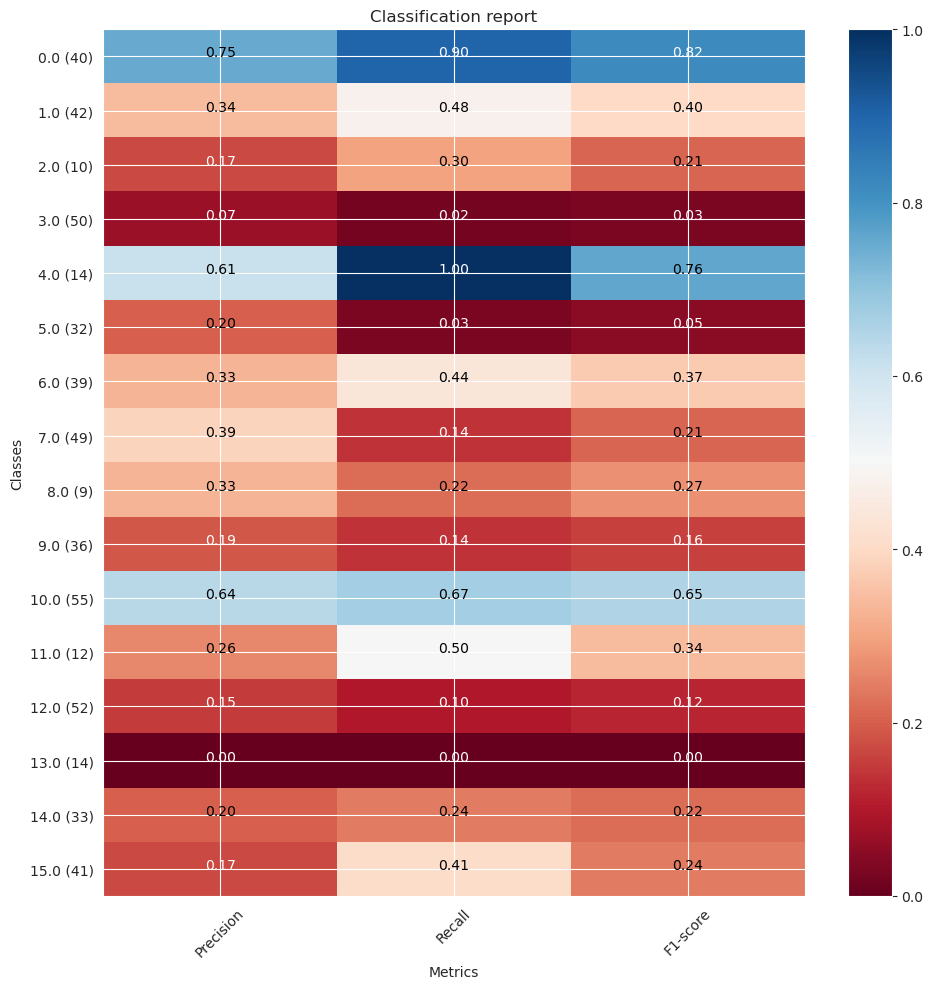

In [24]:
xgb_best = study.best_params
model = xgb.XGBClassifier(**xgb_best)
model.fit(train_x_tr,train_y_tr,eval_set=[(valid_x_es,valid_y_es)],early_stopping_rounds=200,verbose=False)
y_pred = model.predict(X_test)
clf =classification_report(valid_y_label, y_pred)
plot_classification_report(clf)
print(clf)

# Compare ensemble

In [25]:
kernel = 1.0 * RBF(1.0)
classifier1 = catboost.CatBoostClassifier(**ct_best, verbose = 0)
classifier2 = lgb.LGBMClassifier(**lgb_best)
classifier3 = xgb.XGBClassifier(**xgb_best)
classifier4 = RandomForestClassifier(n_estimators = 2000, criterion = 'entropy', random_state = 42)
classifier5 = SVC(probability=True)
classifier6 = AdaBoostClassifier(RandomForestClassifier(n_estimators = 1000, criterion = 'entropy', random_state = 42))
classifier7 = GaussianProcessClassifier(kernel=kernel)
classifier8 = catboost.CatBoostClassifier(verbose = 0)
classifier9 = xgb.XGBClassifier()

sclf = StackingCVClassifier(classifiers = [classifier1, classifier2, classifier3, classifier4, 
                                           classifier5, classifier6, classifier7],
                            shuffle = False,
                            use_probas = True,
                            cv = StratifiedKFold(n_splits=15),
                            meta_classifier = catboost.CatBoostClassifier(**ct_best, verbose = 0))

In [26]:
classifiers = {"cat": classifier1,
               "lgb": classifier2,
               "xgb": classifier3,
               'rf': classifier4,
               'svc':classifier5,
               "ada":classifier6,
               'gas':classifier7,
               "Stack": sclf}

In [27]:
for key in classifiers:
    # Get classifier
    classifier = classifiers[key]
    
    # Fit classifier
    classifier.fit(X_train, y_train)
        
    # Save fitted classifier
    classifiers[key] = classifier

[LightGBM] [Warning] lambda_l1 is set=4.671332715445447e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.671332715445447e-07
[LightGBM] [Warning] bagging_fraction is set=0.5776828177361821, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5776828177361821
[LightGBM] [Warning] lambda_l2 is set=0.0068109496494957854, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0068109496494957854
[LightGBM] [Warning] feature_fraction is set=0.7570856936513126, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7570856936513126
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] lambda_l1 is set=4.671332715445447e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.671332715445447e-07
[LightGBM] [Warning] bagging_fraction is set=0.5776828177361821, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5776828177361821
[LightGBM] [Warning] lambd

In [28]:
voting_clf = VotingClassifier(estimators=[
    ("cat", classifier1),
    ("lgb", classifier2),
    ("xgb", classifier3),
    ('rf', classifier4),
    ('svc', classifier5),
    ("ada", classifier6),
    ('gas', classifier7),
    ('cat2', classifier8),
    ('xgb2', classifier9),
    ("Stack", sclf)    
], voting='soft', n_jobs=-1, verbose=True)

voting_clf.fit(X_train, y_train)

[Voting] ..................... (1 of 10) Processing cat, total= 3.3min
[Voting] ..................... (2 of 10) Processing lgb, total=   3.9s
[Voting] ..................... (3 of 10) Processing xgb, total=   7.2s
[Voting] ...................... (4 of 10) Processing rf, total=   6.5s
[Voting] ..................... (5 of 10) Processing svc, total=   0.4s
[Voting] ..................... (6 of 10) Processing ada, total=   3.5s
[Voting] ..................... (7 of 10) Processing gas, total=  27.0s
[Voting] .................... (8 of 10) Processing cat2, total= 2.0min
[Voting] .................... (9 of 10) Processing xgb2, total=  10.6s
[LightGBM] [Warning] lambda_l1 is set=4.671332715445447e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.671332715445447e-07
[LightGBM] [Warning] bagging_fraction is set=0.5776828177361821, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5776828177361821
[LightGBM] [Warning] lambda_l2 is set=0.0068109496494957854, reg_lambda=0.0

VotingClassifier(estimators=[('cat',
                              <catboost.core.CatBoostClassifier object at 0x7d8deb764a10>),
                             ('lgb',
                              LGBMClassifier(bagging_fraction=0.5776828177361821,
                                             bagging_freq=4,
                                             feature_fraction=0.7570856936513126,
                                             lambda_l1=4.671332715445447e-07,
                                             lambda_l2=0.0068109496494957854,
                                             min_child_samples=10,
                                             num_leaves=77)),
                             ('xgb',
                              XGBClassifier(alpha=8.58865127321297e-0...
                                                                AdaBoostClassifier(base_estimator=RandomForestClassifier(criterion='entropy',
                                                                        

# Generating Top K for a rows

In [29]:
for key in classifiers:
    # Make prediction on test set
    y_pred0 = classifiers[key].predict_proba(X_test)
y_pred1 = voting_clf.predict_proba(X_test)
y_pred = y_pred0*0.4+y_pred1*0.6

In [30]:
# Lets take a look at getting our top 3 prognoses for just a single prediction first
print("Output of predict_proba:")
print(y_pred[0])

Output of predict_proba:
[0.01656889 0.02913679 0.01121661 0.11789685 0.00582865 0.07230303
 0.39208192 0.06052874 0.01475144 0.04329946 0.01112768 0.02213933
 0.073374   0.00944423 0.03173599 0.08856639]


In [31]:
sorted_prediction_ids = np.argsort(-y_pred[0]) 
print("Indices sorted by probabilities:")
print(sorted_prediction_ids)

Indices sorted by probabilities:
[ 6  3 15 12  5  7  9 14  1 11  0  8  2 10 13  4]


In [32]:
top_3_prediction_ids = sorted_prediction_ids[:3]
top_3_predictions = enc.inverse_transform(top_3_prediction_ids.reshape(-1, 1)) # inverse_transform expects a 2D array, so we reshape our vector (but this won't be necessary when we run on multiple predictions at once)
top_3_predictions

array([['Malaria'],
       ['Japanese_encephalitis'],
       ['Zika']], dtype=object)

# Generating Test Predictions

In [33]:
for key in classifiers:
    # Make prediction on test set
    predictions0 = classifiers[key].predict_proba(X_total)
predictions1 = voting_clf.predict_proba(X_total)
predictions = predictions1*0.6+predictions0*0.4

In [34]:
# Get the sorted indices of predictions and take the top 3
sorted_prediction_ids = np.argsort(-predictions, axis=1)
top_3_prediction_ids = sorted_prediction_ids[:,:3]

# Because enc.inverse_transform expects a specific shape (a 2D array with 1 column) we can save the original shape to reshape to after decoding
original_shape = top_3_prediction_ids.shape
top_3_predictions = enc.inverse_transform(top_3_prediction_ids.reshape(-1, 1))
top_3_predictions = top_3_predictions.reshape(original_shape)
top_3_predictions[:10] # Spot check our first 10 values

array([['Dengue', 'Rift_Valley_fever', 'Japanese_encephalitis'],
       ['Chikungunya', 'Dengue', 'Japanese_encephalitis'],
       ['Zika', 'Dengue', 'Rift_Valley_fever'],
       ['Dengue', 'Rift_Valley_fever', 'Japanese_encephalitis'],
       ['Zika', 'West_Nile_fever', 'Rift_Valley_fever'],
       ['Zika', 'Malaria', 'Plague'],
       ['Malaria', 'Zika', 'Plague'],
       ['Dengue', 'Chikungunya', 'Japanese_encephalitis'],
       ['Zika', 'Japanese_encephalitis', 'Yellow_Fever'],
       ['Zika', 'Malaria', 'Yellow_Fever']], dtype=object)

# Make prediction

In [35]:
sub = pd.read_csv('/kaggle/input/playground-series-s3e13/sample_submission.csv')
# Now to get our array of labels into a single column for our submission we can just join on on a space across axis 1
sub['prognosis'] = np.apply_along_axis(lambda x: ' '.join(x), 1, top_3_predictions)
sub['prognosis'][:10] # Spot check our first 10 values

0    Dengue Rift_Valley_fever Japanese_encephalitis
1          Chikungunya Dengue Japanese_encephalitis
2                     Zika Dengue Rift_Valley_fever
3    Dengue Rift_Valley_fever Japanese_encephalitis
4            Zika West_Nile_fever Rift_Valley_fever
5                               Zika Malaria Plague
6                               Malaria Zika Plague
7          Dengue Chikungunya Japanese_encephalitis
8           Zika Japanese_encephalitis Yellow_Fever
9                         Zika Malaria Yellow_Fever
Name: prognosis, dtype: object

In [36]:
sub.to_csv('submission.csv', index=False)